In [2]:
!pip install matplotlib seaborn plotly pandas numpy


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from google.colab import auth
from google.cloud import bigquery


In [4]:
auth.authenticate_user()
bigquery_client = bigquery.Client(project='proyecto4-flightdelay-432516')


In [5]:
project_id= "proyecto4-flightdelay-432516"
dataset_id = "Dataset"
table_id = "view_consolidado_completo"

In [6]:
query = """
SELECT FL_DATE, AIRLINE_CODE, DOT_CODE, FL_NUMBER, ORIGIN, ORIGIN_CITY, DEST, DEST_CITY, CRS_DEP_TIME, DEP_TIME, DEP_DELAY, TAXI_OUT, WHEELS_OFF, WHEELS_ON, TAXI_IN, CRS_ARR_TIME, ARR_TIME, ARR_DELAY, CANCELLED, CANCELLATION_CODE, DIVERTED, CRS_ELAPSED_TIME, ELAPSED_TIME, AIR_TIME, DISTANCE, DELAY_DUE_CARRIER, DELAY_DUE_WEATHER, DELAY_DUE_NAS, DELAY_DUE_SECURITY, DELAY_DUE_LATE_AIRCRAFT, FL_YEAR, FL_MONTH, FL_DAY, DELAY_DUE_CARRIER_NN, DELAY_DUE_WEATHER_NN, DELAY_DUE_LATE_AIRCRAFT_NN, DELAY_DUE_NAS_NN, DELAY_DUE_SECURITY_NN, ESTATUS_VUELO, ETIQUETA_NUM
from `proyecto4-flightdelay-432516.Dataset.view_consolidado_completo`
"""


In [7]:
df = bigquery_client.query(query).to_dataframe()

In [8]:
df.head()


,FL_DATE,AIRLINE_CODE,DOT_CODE,FL_NUMBER,ORIGIN,ORIGIN_CITY,DEST,DEST_CITY,CRS_DEP_TIME,DEP_TIME,...,FL_YEAR,FL_MONTH,FL_DAY,DELAY_DUE_CARRIER_NN,DELAY_DUE_WEATHER_NN,DELAY_DUE_LATE_AIRCRAFT_NN,DELAY_DUE_NAS_NN,DELAY_DUE_SECURITY_NN,ESTATUS_VUELO,ETIQUETA_NUM
0,2023-01-02,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1242,...,2023,1,2,0,0,0,0,0,A TIEMPO,0
1,2023-01-03,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1243,...,2023,1,3,0,0,0,0,0,A TIEMPO,0
2,2023-01-04,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1256,...,2023,1,4,0,0,0,0,0,A TIEMPO,0
3,2023-01-05,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1242,...,2023,1,5,0,0,0,0,0,A TIEMPO,0
4,2023-01-06,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1240,...,2023,1,6,0,0,0,0,0,A TIEMPO,0


Medidas de tendencia central consolidado

In [9]:
df['ARR_DELAY'].describe()

,ARR_DELAY
count,527197.0
mean,7.776393
std,57.396811
min,-80.0
25%,-15.0
50%,-5.0
75%,11.0
max,3063.0


In [10]:
import pandas as pd
import plotly.express as px
# Supongamos que ya tienes un DataFrame df con una columna llamada 'edad'
DEP_DELAY = df['ARR_DELAY']
# Crear el histograma interactivo
fig = px.histogram(DEP_DELAY, x='ARR_DELAY', title='Histograma ARR_DELAY')
# Mostrar el histograma interactivo
fig.show()

In [11]:
#DataFrame df con una columna llamada 'DEP_DELAY'
ARR_DELAY = df['ARR_DELAY']
# Calcular Q1 (primer cuartil) y Q3 (tercer cuartil)
Q1 = ARR_DELAY.quantile(0.25)
Q3 = ARR_DELAY.quantile(0.75)
# Calcular el IQR
IQR = Q3 - Q1
print(f"El primer cuartil (Q1) es: {Q1}")
print(f"El tercer cuartil (Q3) es: {Q3}")
print(f"El rango intercuartil (IQR) es: {IQR}")
# Definir los límites para los outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Identificar los outliers
outliers = ARR_DELAY[(ARR_DELAY < lower_bound)|(ARR_DELAY > upper_bound)]
print(f"El límite inferior para los outliers es: {lower_bound}")
print(f"El límite superior para los outliers es: {upper_bound}")
print(f"Los outliers son: \n{outliers}")



El primer cuartil (Q1) es: -15
El tercer cuartil (Q3) es: 11
El rango intercuartil (IQR) es: 26
El límite inferior para los outliers es: -54.0
El límite superior para los outliers es: 50.0
Los outliers son: 
10        291
14         70
20        413
33         80
34        105
         ... 
538725     81
538747     70
538748    290
538776     62
538807     81
Name: ARR_DELAY, Length: 48102, dtype: Int64


In [12]:
import plotly.express as px
import pandas as pd
# Crear un boxplot interactivo usando Plotly
fig = px.box(df, y='ARR_DELAY', points="all", title="ARR_DELAY")
# Mostrar el gráfico
fig.show()

In [13]:
df['DEP_DELAY'].describe()


,DEP_DELAY
count,528855.0
mean,12.937247
std,55.435948
min,-52.0
25%,-6.0
50%,-2.0
75%,10.0
max,3024.0


In [14]:
import pandas as pd
import plotly.express as px
# Supongamos que ya tienes un DataFrame df con una columna llamada 'edad'
DEP_DELAY = df['DEP_DELAY']
# Crear el histograma interactivo
fig = px.histogram(DEP_DELAY, x='DEP_DELAY', title='Histograma DEP_DELAY')
# Mostrar el histograma interactivo
fig.show()

In [15]:
#DataFrame df con una columna llamada 'DEP_DELAY'
DEP_DELAY = df['DEP_DELAY']
# Calcular Q1 (primer cuartil) y Q3 (tercer cuartil)
Q1 = DEP_DELAY.quantile(0.25)
Q3 = DEP_DELAY.quantile(0.75)
# Calcular el IQR
IQR = Q3 - Q1
print(f"El primer cuartil (Q1) es: {Q1}")
print(f"El tercer cuartil (Q3) es: {Q3}")
print(f"El rango intercuartil (IQR) es: {IQR}")
# Definir los límites para los outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Identificar los outliers
outliers = DEP_DELAY[(DEP_DELAY < lower_bound)|(DEP_DELAY > upper_bound)]
print(f"El límite inferior para los outliers es: {lower_bound}")
print(f"El límite superior para los outliers es: {upper_bound}")
print(f"Los outliers son: \n{outliers}")



El primer cuartil (Q1) es: -6
El tercer cuartil (Q3) es: 10
El rango intercuartil (IQR) es: 16
El límite inferior para los outliers es: -30.0
El límite superior para los outliers es: 34.0
Los outliers son: 
10        315
14         86
20        385
31         56
33         62
         ... 
538747     78
538748    305
538750     43
538776     62
538807     76
Name: DEP_DELAY, Length: 65189, dtype: Int64


In [16]:
import plotly.express as px
import pandas as pd
# Crear un boxplot interactivo usando Plotly
fig = px.box(df, y='DEP_DELAY', points="all", title="DEP_DELAY")
# Mostrar el gráfico
fig.show()

In [17]:
project_id= "proyecto4-flightdelay-432516"
dataset_id = "Dataset"
table_id = "view_flights_completo"

In [18]:
query = """
SELECT FL_DATE, AIRLINE_CODE, DOT_CODE, FL_NUMBER, ORIGIN, ORIGIN_CITY, DEST, DEST_CITY, CRS_DEP_TIME, DEP_TIME, DEP_DELAY, TAXI_OUT, WHEELS_OFF, WHEELS_ON, TAXI_IN, CRS_ARR_TIME, ARR_TIME, ARR_DELAY, CANCELLED, CANCELLATION_CODE, DIVERTED, CRS_ELAPSED_TIME, ELAPSED_TIME, AIR_TIME, DISTANCE,FL_YEAR, FL_MONTH, FL_DAY, DELAY_DUE_CARRIER_NN, DELAY_DUE_WEATHER_NN, DELAY_DUE_LATE_AIRCRAFT_NN, DELAY_DUE_NAS_NN, DELAY_DUE_SECURITY_NN, ESTATUS_VUELO, ETIQUETA_NUM
from `proyecto4-flightdelay-432516.Dataset.view_flights_completo`
"""


In [19]:
df= bigquery_client.query(query).to_dataframe()

In [20]:
df.head()

,FL_DATE,AIRLINE_CODE,DOT_CODE,FL_NUMBER,ORIGIN,ORIGIN_CITY,DEST,DEST_CITY,CRS_DEP_TIME,DEP_TIME,...,FL_YEAR,FL_MONTH,FL_DAY,DELAY_DUE_CARRIER_NN,DELAY_DUE_WEATHER_NN,DELAY_DUE_LATE_AIRCRAFT_NN,DELAY_DUE_NAS_NN,DELAY_DUE_SECURITY_NN,ESTATUS_VUELO,ETIQUETA_NUM
0,2023-01-02,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1242,...,2023,1,2,0,0,0,0,0,A TIEMPO,0
1,2023-01-03,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1243,...,2023,1,3,0,0,0,0,0,A TIEMPO,0
2,2023-01-04,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1256,...,2023,1,4,0,0,0,0,0,A TIEMPO,0
3,2023-01-05,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1242,...,2023,1,5,0,0,0,0,0,A TIEMPO,0
4,2023-01-06,9E,20363,5014,ABE,"Allentown/Bethlehem/Easton, PA",ATL,"Atlanta, GA",1247,1240,...,2023,1,6,0,0,0,0,0,A TIEMPO,0


Medidas de tendencia central Vuelos retrados

In [21]:
df['ARR_DELAY'].describe()

,ARR_DELAY
count,527197.0
mean,7.776393
std,57.396811
min,-80.0
25%,-15.0
50%,-5.0
75%,11.0
max,3063.0


In [22]:
import pandas as pd
import plotly.express as px
# Supongamos que ya tienes un DataFrame df con una columna llamada 'edad'
DEP_DELAY = df['ARR_DELAY']
# Crear el histograma interactivo
fig = px.histogram(DEP_DELAY, x='ARR_DELAY', title='Histograma ARR_DELAY')
# Mostrar el histograma interactivo
fig.show()

In [23]:
#DataFrame df con una columna llamada 'DEP_DELAY'
ARR_DELAY = df['ARR_DELAY']
# Calcular Q1 (primer cuartil) y Q3 (tercer cuartil)
Q1 = ARR_DELAY.quantile(0.25)
Q3 = ARR_DELAY.quantile(0.75)
# Calcular el IQR
IQR = Q3 - Q1
print(f"El primer cuartil (Q1) es: {Q1}")
print(f"El tercer cuartil (Q3) es: {Q3}")
print(f"El rango intercuartil (IQR) es: {IQR}")
# Definir los límites para los outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Identificar los outliers
outliers = ARR_DELAY[(ARR_DELAY < lower_bound)|(ARR_DELAY > upper_bound)]
print(f"El límite inferior para los outliers es: {lower_bound}")
print(f"El límite superior para los outliers es: {upper_bound}")
print(f"Los outliers son: \n{outliers}")



El primer cuartil (Q1) es: -15
El tercer cuartil (Q3) es: 11
El rango intercuartil (IQR) es: 26
El límite inferior para los outliers es: -54.0
El límite superior para los outliers es: 50.0
Los outliers son: 
10        291
14         70
20        413
33         80
34        105
         ... 
538725     81
538747     70
538748    290
538776     62
538807     81
Name: ARR_DELAY, Length: 48102, dtype: Int64


In [24]:
import plotly.express as px
import pandas as pd
# Crear un boxplot interactivo usando Plotly
fig = px.box(df, y='ARR_DELAY', points="all", title="ARR_DELAY")
# Mostrar el gráfico
fig.show()

In [25]:
df['DEP_DELAY'].describe()

,DEP_DELAY
count,528855.0
mean,12.937247
std,55.435948
min,-52.0
25%,-6.0
50%,-2.0
75%,10.0
max,3024.0


In [26]:
import pandas as pd
import plotly.express as px
# Supongamos que ya tienes un DataFrame df con una columna llamada 'edad'
DEP_DELAY = df['DEP_DELAY']
# Crear el histograma interactivo
fig = px.histogram(DEP_DELAY, x='DEP_DELAY', title='Histograma DEP_DELAY')
# Mostrar el histograma interactivo
fig.show()

In [27]:
#DataFrame df con una columna llamada 'DEP_DELAY'
DEP_DELAY = df['DEP_DELAY']
# Calcular Q1 (primer cuartil) y Q3 (tercer cuartil)
Q1 = DEP_DELAY.quantile(0.25)
Q3 = DEP_DELAY.quantile(0.75)
# Calcular el IQR
IQR = Q3 - Q1
print(f"El primer cuartil (Q1) es: {Q1}")
print(f"El tercer cuartil (Q3) es: {Q3}")
print(f"El rango intercuartil (IQR) es: {IQR}")
# Definir los límites para los outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Identificar los outliers
outliers = DEP_DELAY[(DEP_DELAY < lower_bound)|(DEP_DELAY > upper_bound)]
print(f"El límite inferior para los outliers es: {lower_bound}")
print(f"El límite superior para los outliers es: {upper_bound}")
print(f"Los outliers son: \n{outliers}")


El primer cuartil (Q1) es: -6
El tercer cuartil (Q3) es: 10
El rango intercuartil (IQR) es: 16
El límite inferior para los outliers es: -30.0
El límite superior para los outliers es: 34.0
Los outliers son: 
10        315
14         86
20        385
31         56
33         62
         ... 
538747     78
538748    305
538750     43
538776     62
538807     76
Name: DEP_DELAY, Length: 65189, dtype: Int64


In [28]:
import plotly.express as px
import pandas as pd
# Crear un boxplot interactivo usando Plotly
fig = px.box(df, y='DEP_DELAY', points="all", title="DEP_DELAY")
# Mostrar el gráfico
fig.show()

In [29]:
df['DELAY_DUE_CARRIER_NN'].describe()


,DELAY_DUE_CARRIER_NN
count,538837.0
mean,5.308765
std,35.769781
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,3024.0


In [30]:
import pandas as pd
import plotly.express as px
# Supongamos que ya tienes un DataFrame df con una columna llamada 'edad'
DELAY_DUE_CARRIER_NN = df['DELAY_DUE_CARRIER_NN']
# Crear el histograma interactivo
fig = px.histogram(DELAY_DUE_CARRIER_NN, x='DELAY_DUE_CARRIER_NN', title='Histograma DELAY_DUE_CARRIER_NN')
# Mostrar el histograma interactivo
fig.show()

In [31]:
#DataFrame df con una columna llamada 'DEP_DELAY'
DELAY_DUE_CARRIER_NN = df['DELAY_DUE_CARRIER_NN']
# Calcular Q1 (primer cuartil) y Q3 (tercer cuartil)
Q1 = DELAY_DUE_CARRIER_NN.quantile(0.25)
Q3 = DELAY_DUE_CARRIER_NN.quantile(0.75)
# Calcular el IQR
IQR = Q3 - Q1
print(f"El primer cuartil (Q1) es: {Q1}")
print(f"El tercer cuartil (Q3) es: {Q3}")
print(f"El rango intercuartil (IQR) es: {IQR}")
# Definir los límites para los outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Identificar los outliers
outliers = DELAY_DUE_CARRIER_NN[(DELAY_DUE_CARRIER_NN < lower_bound)|(DELAY_DUE_CARRIER_NN > upper_bound)]
print(f"El límite inferior para los outliers es: {lower_bound}")
print(f"El límite superior para los outliers es: {upper_bound}")
print(f"Los outliers son: \n{outliers}")


El primer cuartil (Q1) es: 0.0
El tercer cuartil (Q3) es: 0.0
El rango intercuartil (IQR) es: 0.0
El límite inferior para los outliers es: 0.0
El límite superior para los outliers es: 0.0
Los outliers son: 
14         70
20        413
25         45
31         45
34        105
         ... 
538680     40
538748    290
538750     28
538758     17
538789     24
Name: DELAY_DUE_CARRIER_NN, Length: 63154, dtype: Int64


In [32]:
import plotly.express as px
import pandas as pd
# Crear un boxplot interactivo usando Plotly
fig = px.box(df, y='DELAY_DUE_CARRIER_NN', points="all", title="DELAY_DUE_CARRIER_NN")
# Mostrar el gráfico
fig.show()

In [33]:
df['DELAY_DUE_WEATHER_NN'].describe()

,DELAY_DUE_WEATHER_NN
count,538837.0
mean,0.949575
std,17.80938
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,1653.0


In [34]:
df['DELAY_DUE_NAS_NN'].describe()

,DELAY_DUE_NAS_NN
count,538837.0
mean,3.172887
std,16.298602
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,1343.0


In [35]:
df['DELAY_DUE_SECURITY_NN'].describe()

,DELAY_DUE_SECURITY_NN
count,538837.0
mean,0.031677
std,1.349076
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,234.0


In [36]:
df['DELAY_DUE_LATE_AIRCRAFT_NN'].describe()

,DELAY_DUE_LATE_AIRCRAFT_NN
count,538837.0
mean,5.578737
std,28.790483
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,2027.0


MATRIZ DE CORRELACION

In [37]:
query = """
SELECT   DEP_DELAY, TAXI_OUT, TAXI_IN,ARR_DELAY, AIR_TIME, DISTANCE,DELAY_DUE_CARRIER_NN, DELAY_DUE_WEATHER_NN, DELAY_DUE_LATE_AIRCRAFT_NN, DELAY_DUE_NAS_NN, DELAY_DUE_SECURITY_NN
from `proyecto4-flightdelay-432516.Dataset.view_flights_completo`
"""

In [38]:
df = pd.read_gbq(query, project_id='proyecto4-flightdelay-432516')

In [39]:
# Verifica el tipo de datos en cada columna
print(df.dtypes)

DEP_DELAY                     Int64
TAXI_OUT                      Int64
TAXI_IN                       Int64
ARR_DELAY                     Int64
AIR_TIME                      Int64
DISTANCE                      Int64
DELAY_DUE_CARRIER_NN          Int64
DELAY_DUE_WEATHER_NN          Int64
DELAY_DUE_LATE_AIRCRAFT_NN    Int64
DELAY_DUE_NAS_NN              Int64
DELAY_DUE_SECURITY_NN         Int64
dtype: object


In [40]:
# Eliminar filas con valores NaN
df = df.dropna()

# O puedes llenar los NaN con un valor específico, como el promedio de la columna
# df = df.fillna(df.mean())


In [41]:
# Verificar qué columnas tienen datos no numéricos
non_numeric_columns = df.columns[df.dtypes == 'object']
print("Columnas no numéricas:", non_numeric_columns)


Columnas no numéricas: Index([], dtype='object')


In [42]:
# Mostrar las primeras filas de las columnas no numéricas
print(df[non_numeric_columns].head())


Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4]


In [43]:
# Intentar convertir a numérico, forzando los errores a NaN
df[non_numeric_columns] = df[non_numeric_columns].apply(pd.to_numeric, errors='coerce')

# Revisar si la conversión fue exitosa
print(df[non_numeric_columns].head())


Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4]


In [44]:
# Eliminar filas con valores NaN
df = df.dropna()

# O, si prefieres, llenar los NaN con el promedio de la columna
# df = df.fillna(df.mean())


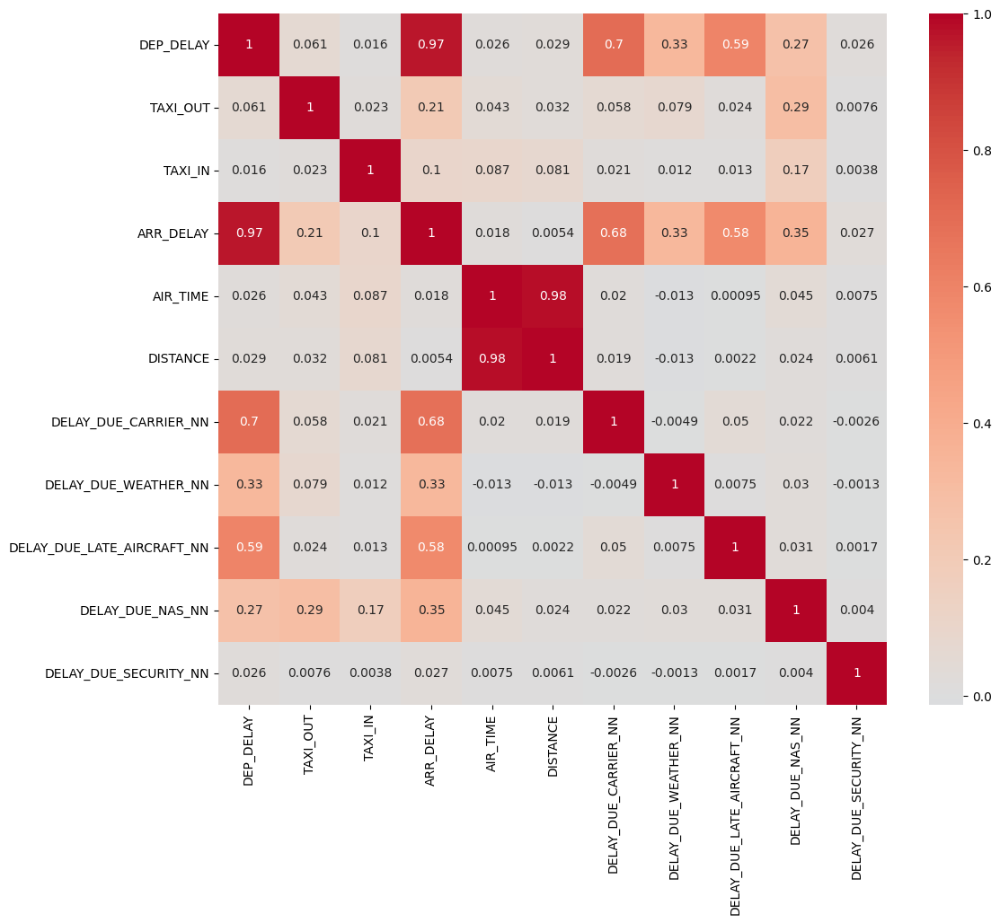

In [45]:
correlation_matrix = df.corr()

# Crear el gráfico de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.show()


Regresion Lineal ARR_DELAY DEP_DELAY

In [46]:
from google.colab import auth
from google.cloud import bigquery

In [47]:
auth.authenticate_user()
bigquery_client = bigquery.Client(project='proyecto4-flightdelay-432516')

In [48]:
query = """
SELECT   DEP_DELAY, ARR_DELAY, DELAY_DUE_CARRIER_NN, DELAY_DUE_WEATHER_NN, DELAY_DUE_LATE_AIRCRAFT_NN, DELAY_DUE_NAS_NN, DELAY_DUE_SECURITY_NN
from `proyecto4-flightdelay-432516.Dataset.view_flights_completo`
"""

In [49]:
df = bigquery_client.query(query).to_dataframe()

Limpieza de datos:

In [50]:
df['DEP_DELAY'] = pd.to_numeric(df['DEP_DELAY'], errors='coerce')
df['ARR_DELAY'] = pd.to_numeric(df['ARR_DELAY'], errors='coerce')
df = df.dropna(subset=['DEP_DELAY', 'ARR_DELAY'])
print(df.head())

   DEP_DELAY  ARR_DELAY  DELAY_DUE_CARRIER_NN  DELAY_DUE_WEATHER_NN  \
0         -5        -32                     0                     0   
1        315        291                     0                     0   
2         -6        -32                     0                     0   
3         86         70                    70                     0   
4        -10        -35                     0                     0   

   DELAY_DUE_LATE_AIRCRAFT_NN  DELAY_DUE_NAS_NN  DELAY_DUE_SECURITY_NN  
0                           0                 0                      0  
1                         291                 0                      0  
2                           0                 0                      0  
3                           0                 0                      0  
4                           0                 0                      0  


Dividir los datos en conjuntos de entrenamiento y prueba

In [51]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras (X) y la variable objetivo (y)
X = df[['DEP_DELAY']]
y = df['ARR_DELAY']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(421757, 1) (105440, 1) (421757,) (105440,)


Entrenar y evaluar el modelo de regresión lineal

In [52]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Crear una instancia del modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

# Mostrar los coeficientes del modelo
print(f"Intercepción: {model.intercept_}")
print(f"Coeficiente: {model.coef_[0]}")

Error cuadrático medio (MSE): 218.81528809381913
Coeficiente de determinación (R^2): 0.9292980256754125
Intercepción: -5.189343587907849
Coeficiente: 1.0093251965200396


In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

Predecir en el conjunto de entrenamiento para dibujar la línea de regresión

In [54]:
y_train_pred = model.predict(X_train)

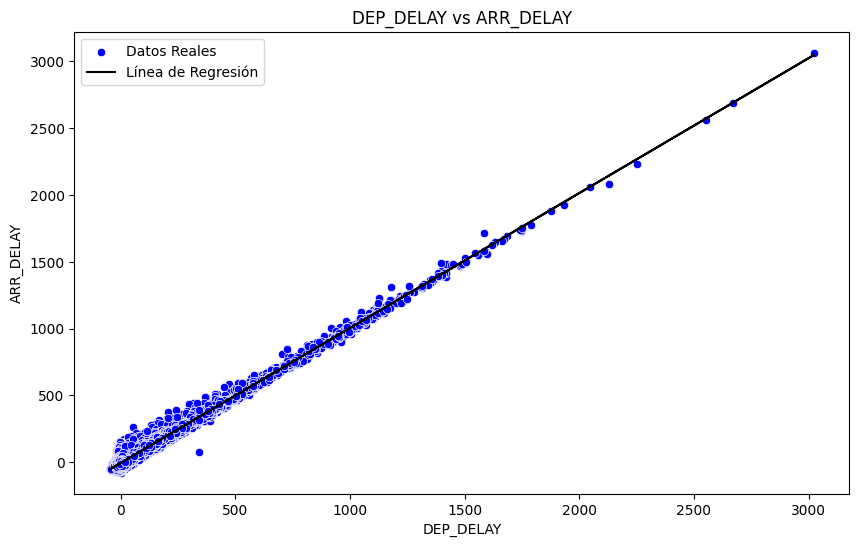

In [55]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DEP_DELAY'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DEP_DELAY'], y_train_pred, color='black', label='Línea de Regresión')
plt.title('DEP_DELAY vs ARR_DELAY')
plt.xlabel('DEP_DELAY')
plt.ylabel('ARR_DELAY')


plt.legend()
plt.show()

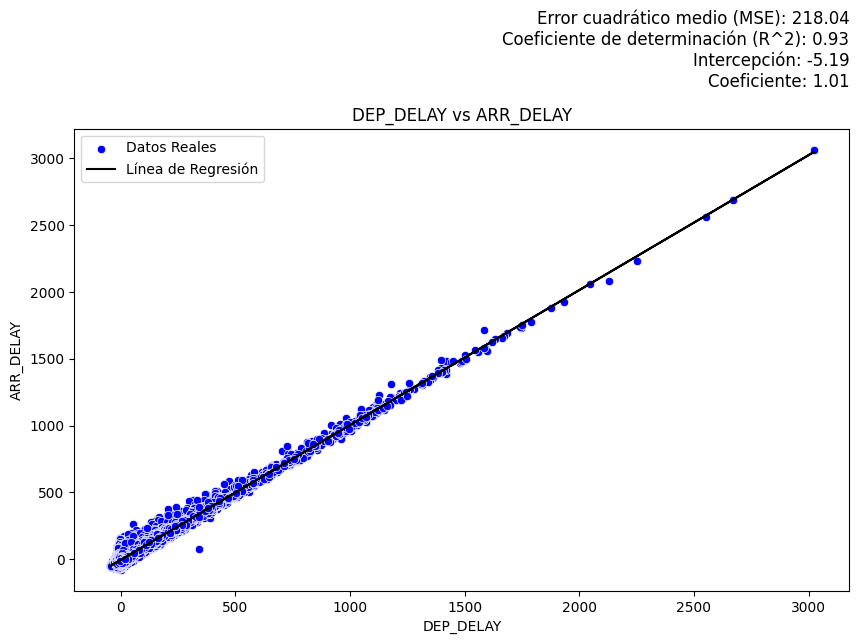

In [56]:
# Asegúrate de tener un modelo de regresión entrenado
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Ejemplo de entrenamiento (usa tus propios datos)
model = LinearRegression()
model.fit(X_train[['DEP_DELAY']], y_train)

# Predicciones
y_train_pred = model.predict(X_train[['DEP_DELAY']])

# Ahora puedes calcular las métricas
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
intercept = model.intercept_
coef = model.coef_

# Crear la gráfica
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DEP_DELAY'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DEP_DELAY'], y_train_pred, color='black', label='Línea de Regresión')

# Agregar título y etiquetas
plt.title('DEP_DELAY vs ARR_DELAY')
plt.xlabel('DEP_DELAY')
plt.ylabel('ARR_DELAY')

# Crear el texto de las métricas
metricas_texto = (
    f'Error cuadrático medio (MSE): {mse:.2f}\n'
    f'Coeficiente de determinación (R^2): {r2:.2f}\n'
    f'Intercepción: {intercept:.2f}\n'
    f'Coeficiente: {coef[0]:.2f}'
)

# Colocar el texto en la esquina inferior derecha
plt.gcf().text(0.90, 0.95, metricas_texto, fontsize=12, ha='right')

plt.legend()
plt.show()



DELAY_DUE_CARRIER_NN VS ARR_DELAY

In [57]:
df['DELAY_DUE_CARRIER_NN'] = pd.to_numeric(df['DELAY_DUE_CARRIER_NN'], errors='coerce')
df['ARR_DELAY'] = pd.to_numeric(df['ARR_DELAY'], errors='coerce')
df = df.dropna(subset=['DELAY_DUE_CARRIER_NN', 'ARR_DELAY'])
print(df.head())

   DEP_DELAY  ARR_DELAY  DELAY_DUE_CARRIER_NN  DELAY_DUE_WEATHER_NN  \
0         -5        -32                     0                     0   
1        315        291                     0                     0   
2         -6        -32                     0                     0   
3         86         70                    70                     0   
4        -10        -35                     0                     0   

   DELAY_DUE_LATE_AIRCRAFT_NN  DELAY_DUE_NAS_NN  DELAY_DUE_SECURITY_NN  
0                           0                 0                      0  
1                         291                 0                      0  
2                           0                 0                      0  
3                           0                 0                      0  
4                           0                 0                      0  


In [58]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras (X) y la variable objetivo (y)
X = df[['DELAY_DUE_CARRIER_NN']]
y = df['ARR_DELAY']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(421757, 1) (105440, 1) (421757,) (105440,)


In [59]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Crear una instancia del modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

# Mostrar los coeficientes del modelo
print(f"Intercepción: {model.intercept_}")
print(f"Coeficiente: {model.coef_[0]}")

Error cuadrático medio (MSE): 1614.167125023584
Coeficiente de determinación (R^2): 0.47844228059568406
Intercepción: 1.960766599392218
Coeficiente: 1.0792644144875196


In [60]:
y_train_pred = model.predict(X_train)

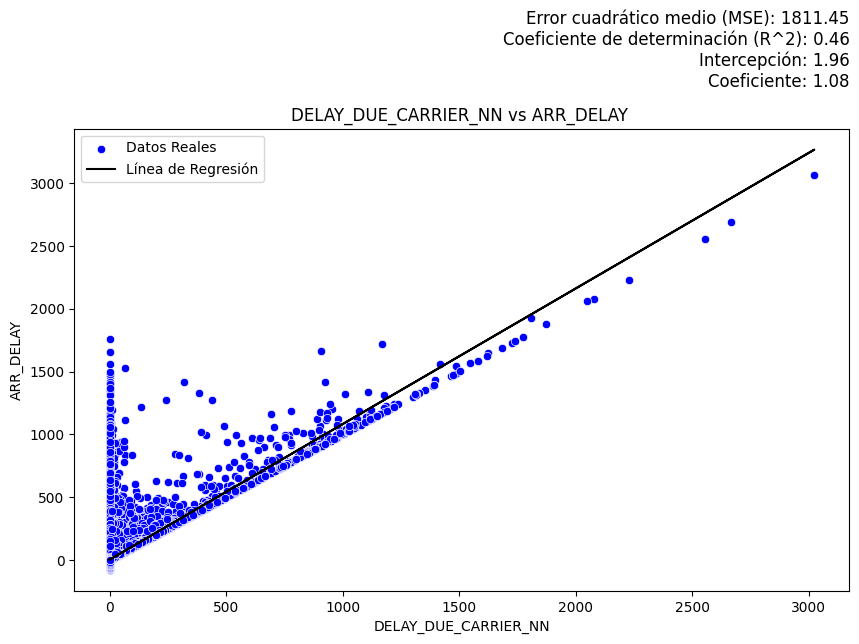

In [61]:
# Asegúrate de tener un modelo de regresión entrenado
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Ejemplo de entrenamiento (usa tus propios datos)
model = LinearRegression()
model.fit(X_train[['DELAY_DUE_CARRIER_NN']], y_train)

# Predicciones
y_train_pred = model.predict(X_train[['DELAY_DUE_CARRIER_NN']])

# Ahora puedes calcular las métricas
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
intercept = model.intercept_
coef = model.coef_

# Crear la gráfica
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DELAY_DUE_CARRIER_NN'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DELAY_DUE_CARRIER_NN'], y_train_pred, color='black', label='Línea de Regresión')

# Agregar título y etiquetas
plt.title('DELAY_DUE_CARRIER_NN vs ARR_DELAY ')
plt.xlabel('DELAY_DUE_CARRIER_NN')
plt.ylabel('ARR_DELAY')

# Crear el texto de las métricas
metricas_texto = (
    f'Error cuadrático medio (MSE): {mse:.2f}\n'
    f'Coeficiente de determinación (R^2): {r2:.2f}\n'
    f'Intercepción: {intercept:.2f}\n'
    f'Coeficiente: {coef[0]:.2f}'
)

# Colocar el texto en la esquina inferior derecha
plt.gcf().text(0.90, 0.95, metricas_texto, fontsize=12, ha='right')

plt.legend()
plt.show()



DELAY_DUE_WEATHER_NN VS ARR_DELAY

In [62]:
df['DELAY_DUE_WEATHER_NN'] = pd.to_numeric(df['DELAY_DUE_WEATHER_NN'], errors='coerce')
df['ARR_DELAY'] = pd.to_numeric(df['ARR_DELAY'], errors='coerce')
df = df.dropna(subset=['DELAY_DUE_WEATHER_NN', 'ARR_DELAY'])


In [63]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras (X) y la variable objetivo (y)
X = df[['DELAY_DUE_WEATHER_NN']]
y = df['ARR_DELAY']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(421757, 1) (105440, 1) (421757,) (105440,)


In [64]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Crear una instancia del modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

# Mostrar los coeficientes del modelo
print(f"Intercepción: {model.intercept_}")
print(f"Coeficiente: {model.coef_[0]}")

Error cuadrático medio (MSE): 2772.7100694374662
Coeficiente de determinación (R^2): 0.1041024699570322
Intercepción: 6.784610969895548
Coeficiente: 1.0501226875036667


In [65]:
y_train_pred = model.predict(X_train)

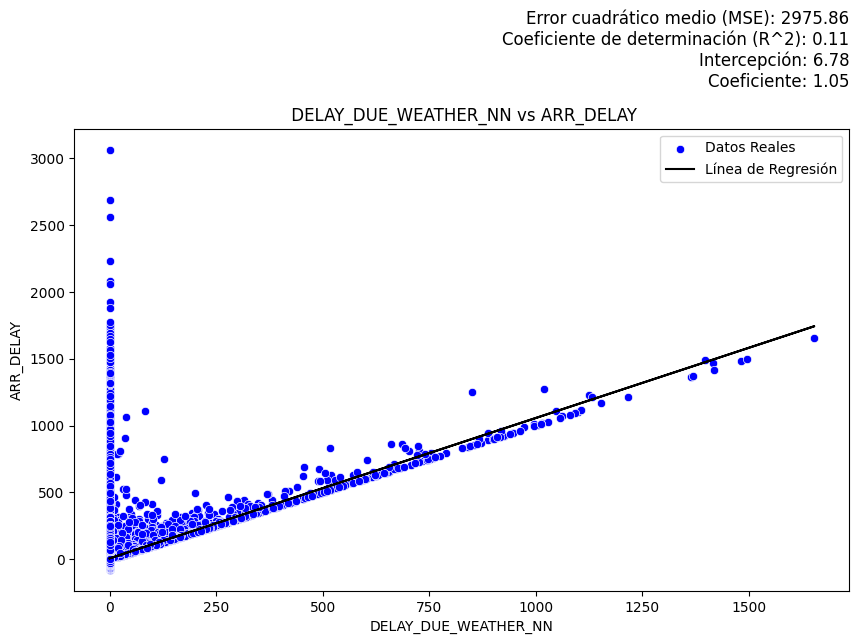

In [66]:


# Asegúrate de tener un modelo de regresión entrenado
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Ejemplo de entrenamiento (usa tus propios datos)
model = LinearRegression()
model.fit(X_train[['DELAY_DUE_WEATHER_NN']], y_train)

# Predicciones
y_train_pred = model.predict(X_train[['DELAY_DUE_WEATHER_NN']])

# Ahora puedes calcular las métricas
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
intercept = model.intercept_
coef = model.coef_

# Crear la gráfica
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DELAY_DUE_WEATHER_NN'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DELAY_DUE_WEATHER_NN'], y_train_pred, color='black', label='Línea de Regresión')

# Agregar título y etiquetas
plt.title(' DELAY_DUE_WEATHER_NN vs ARR_DELAY')
plt.xlabel('DELAY_DUE_WEATHER_NN')
plt.ylabel('ARR_DELAY')

# Crear el texto de las métricas
metricas_texto = (
    f'Error cuadrático medio (MSE): {mse:.2f}\n'
    f'Coeficiente de determinación (R^2): {r2:.2f}\n'
    f'Intercepción: {intercept:.2f}\n'
    f'Coeficiente: {coef[0]:.2f}'
)

# Colocar el texto en la esquina inferior derecha
plt.gcf().text(0.90, 0.95, metricas_texto, fontsize=12, ha='right')

plt.legend()
plt.show()



DELAY_DUE_LATE_AIRCRAFT_NN vs ARR_DELAY

In [67]:
df['DELAY_DUE_LATE_AIRCRAFT_NN'] = pd.to_numeric(df['DELAY_DUE_LATE_AIRCRAFT_NN'], errors='coerce')
df['ARR_DELAY'] = pd.to_numeric(df['ARR_DELAY'], errors='coerce')
df = df.dropna(subset=['DELAY_DUE_LATE_AIRCRAFT_NN', 'ARR_DELAY'])

In [68]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras (X) y la variable objetivo (y)
X = df[['DELAY_DUE_LATE_AIRCRAFT_NN']]
y = df['ARR_DELAY']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(421757, 1) (105440, 1) (421757,) (105440,)


In [69]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Crear una instancia del modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

# Mostrar los coeficientes del modelo
print(f"Intercepción: {model.intercept_}")
print(f"Coeficiente: {model.coef_[0]}")

Error cuadrático medio (MSE): 2089.162643356036
Coeficiente de determinación (R^2): 0.3249652487393173
Intercepción: 1.319430787794559
Coeficiente: 1.133073712143096


In [70]:
y_train_pred = model.predict(X_train)

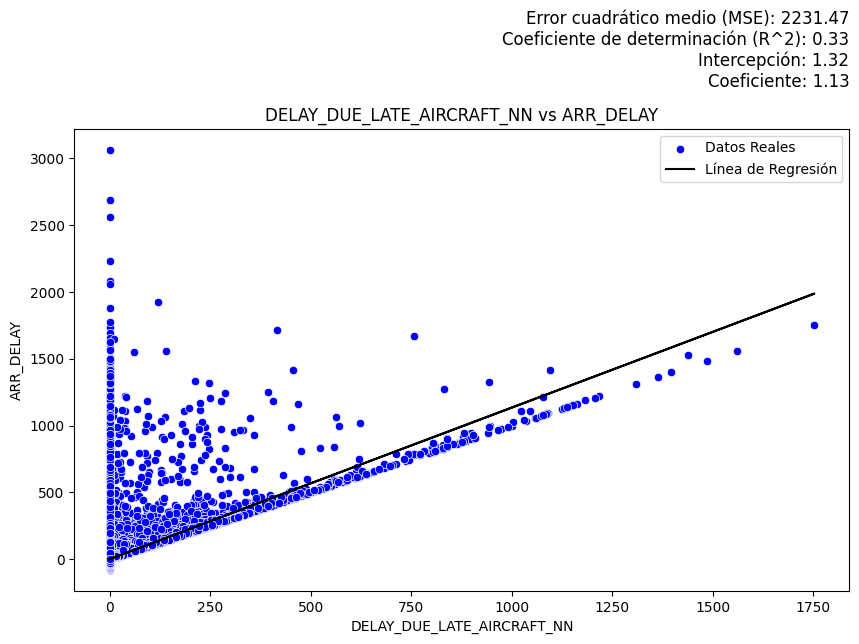

In [71]:
# Asegúrate de tener un modelo de regresión entrenado
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Ejemplo de entrenamiento (usa tus propios datos)
model = LinearRegression()
model.fit(X_train[['DELAY_DUE_LATE_AIRCRAFT_NN']], y_train)

# Predicciones
y_train_pred = model.predict(X_train[['DELAY_DUE_LATE_AIRCRAFT_NN']])

# Ahora puedes calcular las métricas
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
intercept = model.intercept_
coef = model.coef_

# Crear la gráfica
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DELAY_DUE_LATE_AIRCRAFT_NN'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DELAY_DUE_LATE_AIRCRAFT_NN'], y_train_pred, color='black', label='Línea de Regresión')

# Agregar título y etiquetas
plt.title('DELAY_DUE_LATE_AIRCRAFT_NN vs ARR_DELAY')
plt.xlabel('DELAY_DUE_LATE_AIRCRAFT_NN')
plt.ylabel('ARR_DELAY')

# Crear el texto de las métricas
metricas_texto = (
    f'Error cuadrático medio (MSE): {mse:.2f}\n'
    f'Coeficiente de determinación (R^2): {r2:.2f}\n'
    f'Intercepción: {intercept:.2f}\n'
    f'Coeficiente: {coef[0]:.2f}'
)

# Colocar el texto en la esquina inferior derecha
plt.gcf().text(0.90, 0.95, metricas_texto, fontsize=12, ha='right')

plt.legend()
plt.show()


DELAY_DUE_NAS_NN VS ARR_DELAY

In [72]:
df['DELAY_DUE_NAS_NN'] = pd.to_numeric(df['DELAY_DUE_NAS_NN'], errors='coerce')
df['ARR_DELAY'] = pd.to_numeric(df['ARR_DELAY'], errors='coerce')
df = df.dropna(subset=['DELAY_DUE_NAS_NN', 'ARR_DELAY'])

In [73]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras (X) y la variable objetivo (y)
X = df[['DELAY_DUE_NAS_NN']]
y = df['ARR_DELAY']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(421757, 1) (105440, 1) (421757,) (105440,)


In [74]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Crear una instancia del modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

# Mostrar los coeficientes del modelo
print(f"Intercepción: {model.intercept_}")
print(f"Coeficiente: {model.coef_[0]}")

Error cuadrático medio (MSE): 2724.1830849088265
Coeficiente de determinación (R^2): 0.1197821495812571
Intercepción: 3.8253560811013934
Coeficiente: 1.2242254522640725


In [75]:
y_train_pred = model.predict(X_train)

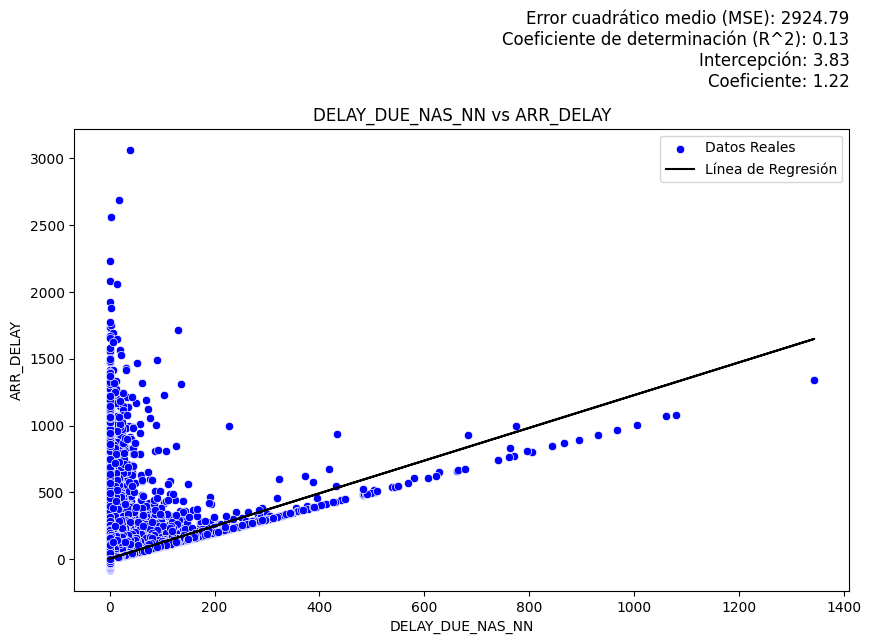

In [76]:
# Asegúrate de tener un modelo de regresión entrenado
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Ejemplo de entrenamiento (usa tus propios datos)
model = LinearRegression()
model.fit(X_train[['DELAY_DUE_NAS_NN']], y_train)

# Predicciones
y_train_pred = model.predict(X_train[['DELAY_DUE_NAS_NN']])

# Ahora puedes calcular las métricas
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
intercept = model.intercept_
coef = model.coef_

# Crear la gráfica
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DELAY_DUE_NAS_NN'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DELAY_DUE_NAS_NN'], y_train_pred, color='black', label='Línea de Regresión')

# Agregar título y etiquetas
plt.title('DELAY_DUE_NAS_NN vs ARR_DELAY')
plt.xlabel('DELAY_DUE_NAS_NN')
plt.ylabel('ARR_DELAY')

# Crear el texto de las métricas
metricas_texto = (
    f'Error cuadrático medio (MSE): {mse:.2f}\n'
    f'Coeficiente de determinación (R^2): {r2:.2f}\n'
    f'Intercepción: {intercept:.2f}\n'
    f'Coeficiente: {coef[0]:.2f}'
)

# Colocar el texto en la esquina inferior derecha
plt.gcf().text(0.90, 0.95, metricas_texto, fontsize=12, ha='right')

plt.legend()
plt.show()


DELAY_DUE_SECURITY_NN VS ARR_DELAY




In [90]:
df['DELAY_DUE_SECURITY_NN'] = pd.to_numeric(df['DELAY_DUE_SECURITY_NN'], errors='coerce')
df['ARR_DELAY'] = pd.to_numeric(df['ARR_DELAY'], errors='coerce')
df = df.dropna(subset=['DELAY_DUE_SECURITY_NN', 'ARR_DELAY'])

In [91]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras (X) y la variable objetivo (y)
X = df[['DELAY_DUE_SECURITY_NN']]
y = df['ARR_DELAY']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(421757, 1) (105440, 1) (421757,) (105440,)


In [92]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Crear una instancia del modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

# Mostrar los coeficientes del modelo
print(f"Intercepción: {model.intercept_}")
print(f"Coeficiente: {model.coef_[0]}")

Error cuadrático medio (MSE): 3092.7753680589053
Coeficiente de determinación (R^2): 0.0006853425595081397
Intercepción: 7.775797787224504
Coeficiente: 1.1296133127158956


In [93]:
y_train_pred = model.predict(X_train)

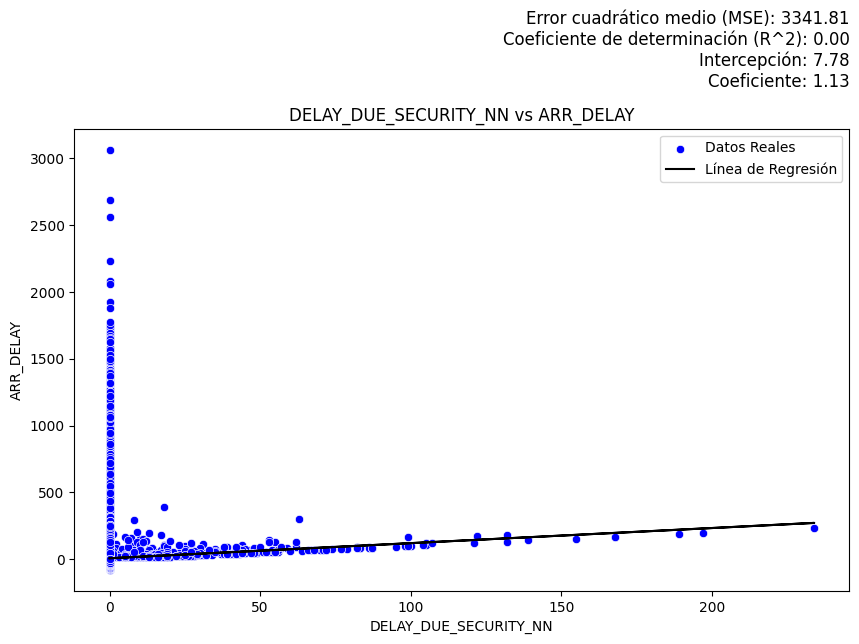

In [94]:
# Asegúrate de tener un modelo de regresión entrenado
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Ejemplo de entrenamiento (usa tus propios datos)
model = LinearRegression()
model.fit(X_train[['DELAY_DUE_SECURITY_NN']], y_train)

# Predicciones
y_train_pred = model.predict(X_train[['DELAY_DUE_SECURITY_NN']])

# Ahora puedes calcular las métricas
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
intercept = model.intercept_
coef = model.coef_

# Crear la gráfica
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_train['DELAY_DUE_SECURITY_NN'], y=y_train, label='Datos Reales', color='blue')
plt.plot(X_train['DELAY_DUE_SECURITY_NN'], y_train_pred, color='black', label='Línea de Regresión')

# Agregar título y etiquetas
plt.title('DELAY_DUE_SECURITY_NN vs ARR_DELAY')
plt.xlabel('DELAY_DUE_SECURITY_NN')
plt.ylabel('ARR_DELAY')

# Crear el texto de las métricas
metricas_texto = (
    f'Error cuadrático medio (MSE): {mse:.2f}\n'
    f'Coeficiente de determinación (R^2): {r2:.2f}\n'
    f'Intercepción: {intercept:.2f}\n'
    f'Coeficiente: {coef[0]:.2f}'
)

# Colocar el texto en la esquina inferior derecha
plt.gcf().text(0.90, 0.95, metricas_texto, fontsize=12, ha='right')

plt.legend()
plt.show()
